# Table of Contents
* [1c. Fixed-flux spinodal decomposition on a T-shaped domain](#1a.-Fixed-flux-spinodal-decomposition-on-a-T-shaped-domain)
	* [Define $f_0$](#Define-$f_0$)
	* [Define the Equation](#Define-the-Equation)
	* [Solve the Equation](#Solve-the-Equation)
	* [Free Energy Plots](#Free-Energy-Plots)
    * [Movie of Evolution](#Movie-of-Evolution)

# 1c. Fixed-flux spinodal decomposition on a T-shaped domain

The chemical free energy is given by

$$ f_{chem}\left[ c \left( \vec{r} \right) \right] = f_0\left[ c \left( \vec{r} \right) \right] = {\rho}_s (c - c_{\alpha})^2 (c_{\beta} - c)^2 $$

In FiPy we write the evolution equation as 

$$ \frac{\partial c}{\partial t} = \nabla \cdot  \left[
       D \left( c \right) \left( \frac{ \partial^2 f_0 }{ \partial c^2} \nabla c - \kappa \nabla \nabla^2 c \right)   \right] $$

Let's start by calculating $ \frac{ \partial^2 f_0 }{ \partial c^2} $ using sympy. It's easy for this case, but useful in the general case for taking care of difficult book keeping in phase field problems.

In [26]:
problem = '1'
domain = 'c'
nx = 100
dx = 2.0

In [27]:
%matplotlib inline

import sympy
import fipy as fp
import numpy as np
import matplotlib.pyplot as plt
import os

In [3]:
c, rho_s, c_alpha, c_beta = sympy.symbols("c_var rho_s c_alpha c_beta")

In [4]:
f_0 = rho_s * (c - c_alpha)**2 * (c_beta - c)**2

In [5]:
print f_0

rho_s*(-c_alpha + c_var)**2*(c_beta - c_var)**2


In [6]:
sympy.diff(f_0, c, 2)

2*rho_s*((c_alpha - c_var)**2 + 4*(c_alpha - c_var)*(c_beta - c_var) + (c_beta - c_var)**2)

The first step in implementing any problem in FiPy is to define the mesh. In this case, the T-shaped domain is constructed out of two rectangular `Grid2D` objects. No other boundary conditions are required.

In [28]:
mesh = fp.Grid2D(Lx=20., Ly=100.0, nx=nx / 5, ny=nx) + (fp.Grid2D(Ly=20.0, Lx=100.0, nx=nx, ny=nx / 5) + [[-40],[100]])

The next step is to define the parameters and create a solution variable.
Constants and initial conditions:
$c_{\alpha}$ and $c_{\beta}$ are concentrations at which the bulk free energy has minima.
$\kappa$ is the gradient energy coefficient.
$\varrho_s$ controls the height of the double-well barrier.

In [8]:
c_alpha = 0.3
c_beta = 0.7
kappa = 2.0
M = 5.0
c_0 = 0.5
epsilon = 0.01
rho_s = 5.0

c_var = fp.CellVariable(mesh=mesh, name=r"$c$", hasOld=True)

In [9]:
c_var.mesh.cellCenters()

array([[   0.5,    1.5,    2.5, ...,   57.5,   58.5,   59.5],
       [   0.5,    0.5,    0.5, ...,  119.5,  119.5,  119.5]])

Now we need to define the initial conditions.

$c_{var}$ is a cell variable specifying concentrations at various points in the mesh. Here, it is the solution variable:

Set $c\left(x, y\right)$ such that

$$ c\left(x, y\right) = \bar{c}_0 + \epsilon_{\Box}[\cos(0.105x) \cos(0.11y) + [\cos(0.13x) \cos(.087y)]^2 + \cos(0.025x-0.15y) \cos(0.07x-0.02y)].$$

In [10]:
# array of sample c-values: used in f versus c plot
vals = np.linspace(-.1, 1.1, 1000)

c_var = fp.CellVariable(mesh=mesh, name=r"$c$", hasOld=True)

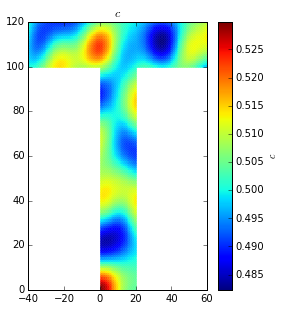

In [11]:
x , y = np.array(mesh.x), np.array(mesh.y)

c_var[:] = c_0 + epsilon * (np.cos(0.105 * x) * np.cos(0.11 * y) + \
                            (np.cos(0.13 * x) * np.cos(0.087 * y))**2 + \
                            + np.cos(0.025 * x - 0.15 * y) * np.cos(0.07 * x - 0.02 * y))

viewer = fp.Viewer(c_var)

## Define $f_0$

To define the equation with FiPy first define `f_0` in terms of FiPy. Recall `f_0` from above calculated using Sympy. Here we use the string representation and set it equal to `f_0_var` using the `exec` command.

In [12]:
out = sympy.diff(f_0, c, 2)

In [13]:
exec "f_0_var = " + repr(out)

In [14]:
#f_0_var = -A + 3*B*(c_var - c_m)**2 + 3*c_alpha*(c_var - c_alpha)**2 + 3*c_beta*(c_var - c_beta)**2
f_0_var

((((pow((0.3 - $c$), 2)) + (((0.3 - $c$) * 4) * (0.7 - $c$))) + (pow((0.7 - $c$), 2))) * 10.0)

In [15]:
# bulk free energy density
def f_0(c):
    return rho_s*((c - c_alpha)**2)*((c_beta-c)**2)
def f_0_var(c_var):
    return 2*rho_s*((c_alpha - c_var)**2 + 4*(c_alpha - c_var)*(c_beta - c_var) + (c_beta - c_var)**2)
# free energy
def f(c):
    return (f_0(c)+ .5*kappa*(c.grad.mag)**2)

Here, the elapsed time, total free energy, and concentration cell variable are saved to separate lists at designated time intervals. These lists are then updated in an .npz file in a directory of your choice.

In [29]:
# save elapsed time and free energy at each data point
time_data = []
cvar_data = []
f_data = []

# checks whether a folder for the data from this simulation exists
# if not, creates one in the home directory
file_dir = "/data/and9/surf-research/Anushka/1{0}example".format(domain)
if not os.path.exists(file_dir):
    os.makedirs(file_dir)

def save_data(time, cvar, f, step):
    time_data.append(time)
    cvar_data.append(np.array(cvar.value))
    f_data.append(f.value)
    
    file_name = file_dir + "/1{0}{1}_{2}".format(domain, nx, str(step).rjust(5, '0'))
    np.savez(file_name, time = time_data, c_var = cvar_data, f = f_data)

## Define the Equation

In [17]:
eqn = fp.TransientTerm(coeff=1.) == fp.DiffusionTerm(M * f_0_var(c_var)) - fp.DiffusionTerm((M, kappa))
eqn

(TransientTerm(coeff=1.0) + (DiffusionTerm(coeff=[-((((((pow((0.3 - $c$), 2)) + (((0.3 - $c$) * 4) * (0.7 - $c$))) + (pow((0.7 - $c$), 2))) * 10.0) * 5.0))]) + DiffusionTerm(coeff=[5.0, 2.0])))

## Solve the Equation

To solve the equation a simple time stepping scheme is used which is decreased or increased based on whether the residual decreases or increases. A time step is recalculated if the required tolerance is not reached. In addition, the time step is kept under 1 unit. The data is saved out every 10 steps.

In [18]:
elapsed = 0.0
steps = 0
dt = 0.01
dt_max = 1.0
total_sweeps = 2
tolerance = 1e-1
total_steps = 2000
duration = 900.0

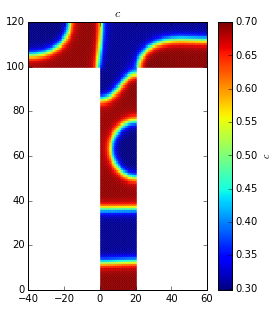

elapsed_time: 463.1014441


In [19]:
c_var.updateOld()
from fipy.solvers.pysparse import LinearLUSolver as Solver
solver = Solver()

while elapsed < duration and steps < total_steps:
    res0 = eqn.sweep(c_var, dt=dt, solver=solver)

    for sweeps in range(total_sweeps):
        res = eqn.sweep(c_var, dt=dt, solver=solver)

    if res < res0 * tolerance:
#         print steps
#         print elapsed
        
        # anything in this loop will only be executed every 10 steps
        if (steps%10==0):
            print "Saving data: step " + str(steps)
            save_data(elapsed, c_var, f(c_var).cellVolumeAverage*mesh.numberOfCells*dx*dx, steps)
            
        steps += 1
        elapsed += dt
        dt *= 1.1
        dt = min(dt, dt_max)
        c_var.updateOld()
    else:
        dt *= 0.8
        c_var[:] = c_var.old
    
viewer.plot()
print 'elapsed_time:', elapsed

## Free Energy Plots

In [30]:
import glob
newest = max(glob.iglob(file_dir + '/1c100*.npz'), key=os.path.getctime)
print newest

/data/and9/surf-research/Anushka/1cexample/1c100_01990.npz


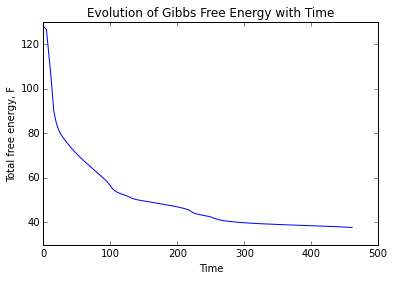

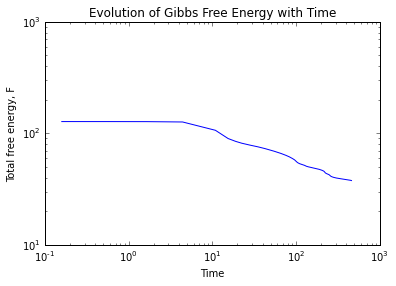

In [31]:
times = np.load(newest)['time']
f = np.load(newest)['f']
plt.figure(1)
plt.xlabel('Time')
plt.ylabel('Total free energy, F')
plt.title('Evolution of Gibbs Free Energy with Time')
plt.plot(times, f)
plt.show()
plt.xlabel('Time')
plt.ylabel('Total free energy, F')
plt.title('Evolution of Gibbs Free Energy with Time')
plt.loglog(times, f)
plt.show()

## Movie of Evolution

At this point, the saved concentration arrays can be used to generate FiPy viewer images at the given time intervals. We load the data and create a viewer for the initial condition.

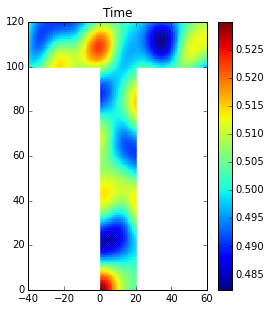

In [32]:
c_np = np.load(newest)['c_var']
c_np_0 = c_np[0]

c_var = fp.CellVariable(value = c_np_0, mesh = mesh)
viewer = fp.Viewer(c_var, title = "Time")
index = 0

Now the viewer is updated at each saved datapoint, and used to generate an image of the concentration distribution alongside the free energy plot up to that point.

saving image 00000
saving image 00001
saving image 00002
saving image 00003
saving image 00004
saving image 00005
saving image 00006
saving image 00007
saving image 00008
saving image 00009
saving image 00010
saving image 00011
saving image 00012
saving image 00013
saving image 00014
saving image 00015
saving image 00016
saving image 00017
saving image 00018
saving image 00019
saving image 00020
saving image 00021
saving image 00022
saving image 00023
saving image 00024
saving image 00025
saving image 00026
saving image 00027
saving image 00028
saving image 00029
saving image 00030
saving image 00031
saving image 00032
saving image 00033
saving image 00034
saving image 00035
saving image 00036
saving image 00037
saving image 00038
saving image 00039
saving image 00040
saving image 00041
saving image 00042
saving image 00043
saving image 00044
saving image 00045
saving image 00046
saving image 00047
saving image 00048
saving image 00049
saving image 00050
saving image 00051
saving image

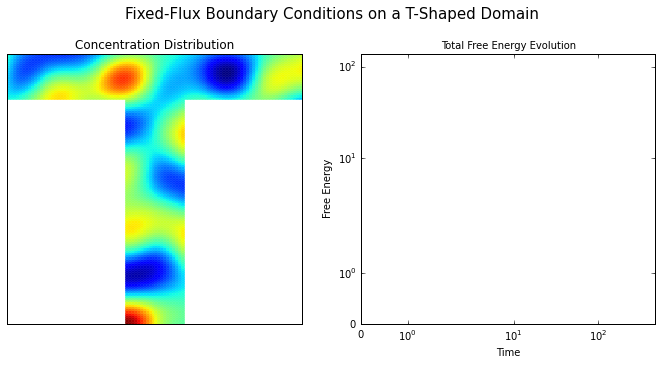

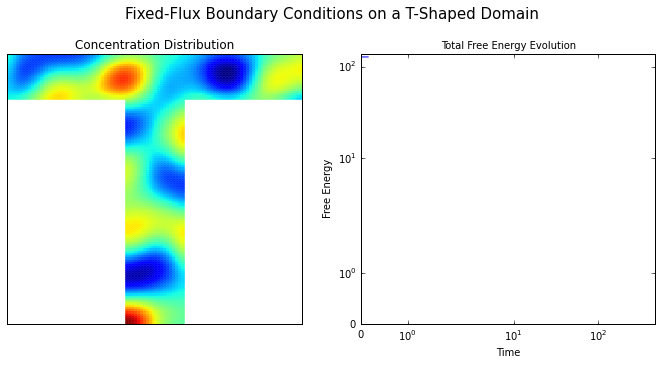

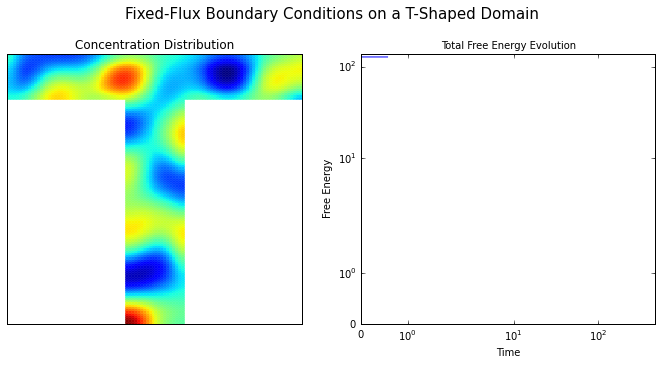

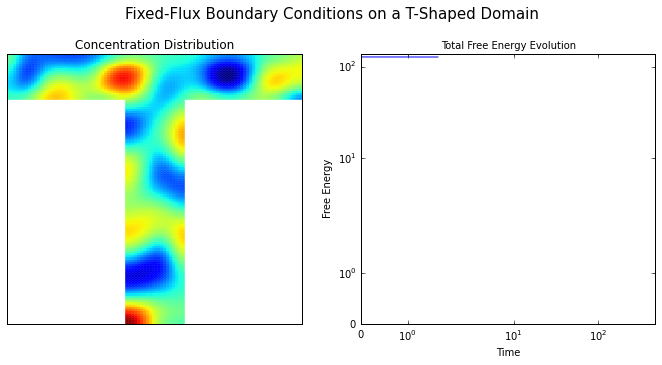

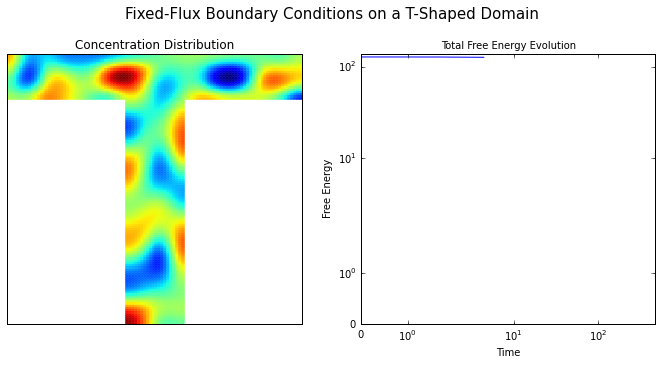

...

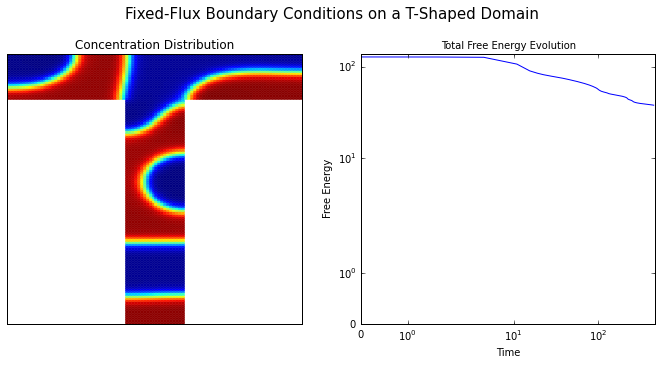

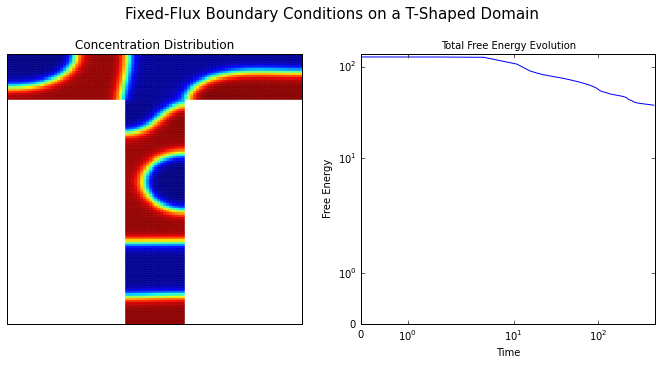

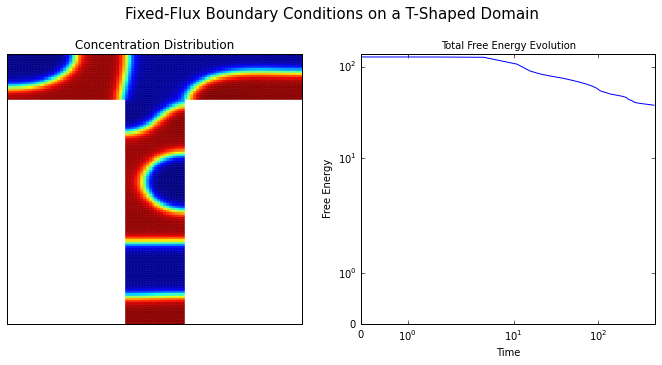

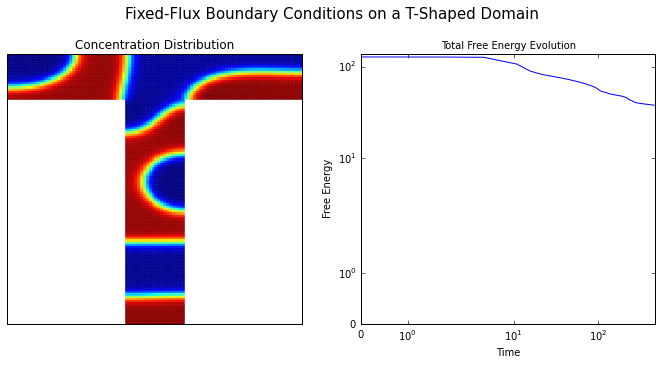

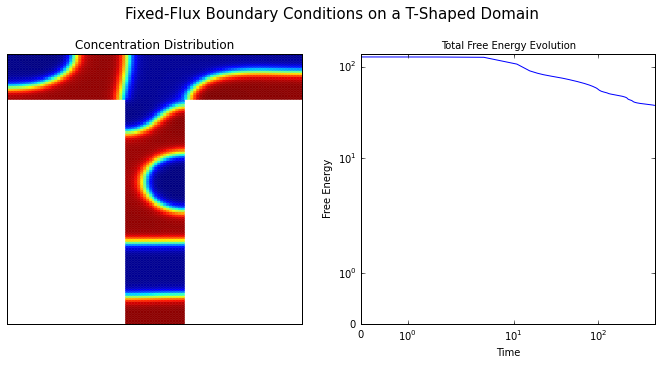

In [33]:
for i in range(len(times)): 
    
    current_time = times[index]
#     print current_time
    
    f_current = f[:(index+1)]
    times_current = times[:(index+1)]
    c_np_current = c_np[index]
    c_var = fp.CellVariable(value = c_np_current, mesh = mesh)

    fig = plt.figure(figsize = (10, 5))
    fig.suptitle('Fixed-Flux Boundary Conditions on a T-Shaped Domain', fontsize = 15)
    
    axes1 = fig.add_subplot(121)
    viewer = fp.Viewer(c_var, axes=axes1, colorbar=None, title = 'Concentration Distribution', fontsize = 10)
    viewer.axes.get_xaxis().set_visible(False)
    viewer.axes.get_yaxis().set_visible(False)

    axes2 = fig.add_subplot(122)
    axes2.set_xlabel('Time', fontsize = 10)
    axes2.set_ylabel('Free Energy', fontsize = 10)
    axes2.set_title('Total Free Energy Evolution', fontsize = 10)
    axes2.set_xlim(0, times[-1] + 10)
    axes2.set_ylim(0, f[0] + 10)
#     print times_current
#     print f_current

    axes2.set_yscale('symlog')
    axes2.set_xscale('symlog')
    axes2.plot(times_current, f_current)

    plt.subplots_adjust(left=.05, right=.95, top=.85, bottom=.1, wspace = .2)
#     fig.show()
    
    file_dir = "/tmp/testimages".format(problem)
    if not os.path.exists(file_dir):
        os.makedirs(file_dir)

    plt.savefig(file_dir + '/image{0}.png'.format(str(index).rjust(5, '0')))
    print "saving image {0}".format(str(index).rjust(5, '0'))
    index += 1

The movie of the evolution for 900 steps.
The movie was generated with the output files of the form image.png using the following commands:

In [34]:
import io
import base64
from IPython.display import HTML

video = io.open('/tmp/testimages/1c_test.mp4', 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<video alt="test" controls>
                <source src="data:video/mp4;base64,{0}" type="video/mp4" />
             </video>'''.format(encoded.decode('ascii')))